
# <center> Code 1: Identifying clusters of environmental and urban morphological dimensions</center>

<br/>

<div style="text-align: center;font-size: 90%;">
    Bruno Dias dos Santos<sup><a href="https://orcid.org/0000-0001-6181-2158"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup><sup><a href="https://orcid.org/0000-0002-0082-9498"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>
    <br/><br/>
    Graduate Program in Remote Sensing, National Institute for Space Research (INPE)
    <br/>
    1758, Avenida dos Astronautas, São José dos Campos, SP 12227-010, Brazil
    <br/><br/>
    Contact: <div><a href="mailto:bruno.santos@inpe.br">bruno.santos@inpe.br</a></div>
    <br/><br/>
</div>
<br/>
<div style="text-align: justify;  margin-left: 25%; margin-right: 25%;">
<b>Abstract.</b>  This Notebook presents a methodology for treating variables and perform an unsupervised classification. Given a shapefile (base_env or base_urb), the attributes will be treated starting from filling in missing values, normalized and removed with respect to their (Pearson's) correlation. Subsequently, we identify clusters with the unsupervised algorithm <i>Hierarchichal Clustering</i>.
</div>    

<br/>

### Step 1: Treatment and selection of variables

Importing libraries:

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

Reading the shapefile with the attributes (base_env or base_urb) and creating a GeoDataFrame:

In [4]:
obj = gpd.read_file("urban_morphological_dimension/base_urb_santarem.shp")

Visualizing the GeoDataFrame:

In [4]:
obj

,ID,CA_As,CA_HG,CA_Ce,CA_Te,CA_FC,NP_HG,NP_Ce,NP_FC,ASM_MEAN,...,TABO_BUP,BIA_BUP,TAOBIA_BUP,PRD,SHDI,SIDI,AREA_PERI,SHAPE_IND,BUP_DENS,geometry
0,5,0.001620,0.061579,0.029756,0.0,0.053946,1,1,1,0.116557,...,0.0920,0.061579,0.0836,99.921886,0.281650,0.978454,101.866389,1.942414,0.009976,"POLYGON ((752688.911 9722816.546, 752689.345 9..."
1,6,0.000000,0.000000,0.020644,0.0,0.010854,0,1,1,0.115503,...,0.0648,0.020644,0.0504,99.921761,0.108855,0.999009,103.394834,1.971559,0.009981,"POLYGON ((752789.095 9722816.113, 752789.529 9..."
2,10,0.018494,0.000000,0.000000,0.0,0.044207,0,0,1,0.126810,...,0.4052,0.044207,0.0512,99.921259,0.173556,0.996075,106.548543,2.031695,0.010001,"POLYGON ((753189.831 9722814.381, 753190.263 9..."
3,11,0.197971,0.000000,0.000000,0.0,0.006993,0,0,1,0.140426,...,0.4052,0.197971,0.4052,99.921134,0.324757,0.958056,105.373534,2.009289,0.010011,"POLYGON ((753290.015 9722813.949, 753290.447 9..."
4,12,0.000000,0.000000,0.000000,0.0,0.074978,0,0,1,0.131484,...,0.1444,0.074978,0.1444,99.921008,0.194141,0.994387,105.809045,2.017594,0.010015,"POLYGON ((753390.199 9722813.517, 753390.631 9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6296,14338,0.018643,0.001913,0.000000,0.0,0.016373,1,0,2,0.138414,...,0.2288,0.018643,0.2288,99.923455,0.121756,0.998638,0.287709,0.109726,0.036505,"POLYGON ((751430.790 9733012.497, 751431.221 9..."
6297,14339,0.000000,0.000000,0.000000,0.0,0.106056,0,0,3,0.136921,...,0.1360,0.047450,0.1360,99.923330,0.237865,0.988769,0.746965,0.286042,0.106056,"POLYGON ((751530.947 9733012.067, 751531.377 9..."
6298,14340,0.000000,0.000000,0.000000,0.0,0.000604,0,0,1,0.141220,...,0.1164,0.000604,0.1164,99.923205,0.004477,1.000000,0.000000,0.000000,0.000604,"POLYGON ((751631.104 9733011.636, 751631.534 9..."
6299,14392,0.000000,0.084629,0.000000,0.0,0.000000,2,0,0,0.139745,...,0.1248,0.044053,0.1248,99.923703,0.208894,0.992849,2.398085,0.752755,0.081360,"POLYGON ((751230.907 9733113.276, 751231.338 9..."


Defining the ID as the identifier variable of each feature:

In [5]:
indice = 'ID'

Creating a GeoDataFrame that will be used in the output:

In [6]:
geom = obj[[indice,'geometry']]

In [7]:
geom

,ID,geometry
0,5,"POLYGON ((752688.911 9722816.546, 752689.345 9..."
1,6,"POLYGON ((752789.095 9722816.113, 752789.529 9..."
2,10,"POLYGON ((753189.831 9722814.381, 753190.263 9..."
3,11,"POLYGON ((753290.015 9722813.949, 753290.447 9..."
4,12,"POLYGON ((753390.199 9722813.517, 753390.631 9..."
...,...,...
6296,14338,"POLYGON ((751430.790 9733012.497, 751431.221 9..."
6297,14339,"POLYGON ((751530.947 9733012.067, 751531.377 9..."
6298,14340,"POLYGON ((751631.104 9733011.636, 751631.534 9..."
6299,14392,"POLYGON ((751230.907 9733113.276, 751231.338 9..."


Extracting the variables for data treatment (var_num):

In [8]:
var_num = pd.DataFrame(obj.select_dtypes(include=['float64','int64','int','float']))

In [9]:
var_num

,ID,CA_As,CA_HG,CA_Ce,CA_Te,CA_FC,NP_HG,NP_Ce,NP_FC,ASM_MEAN,...,PR,TABO_BUP,BIA_BUP,TAOBIA_BUP,PRD,SHDI,SIDI,AREA_PERI,SHAPE_IND,BUP_DENS
0,5,0.001620,0.061579,0.029756,0.0,0.053946,1,1,1,0.116557,...,1,0.0920,0.061579,0.0836,99.921886,0.281650,0.978454,101.866389,1.942414,0.009976
1,6,0.000000,0.000000,0.020644,0.0,0.010854,0,1,1,0.115503,...,1,0.0648,0.020644,0.0504,99.921761,0.108855,0.999009,103.394834,1.971559,0.009981
2,10,0.018494,0.000000,0.000000,0.0,0.044207,0,0,1,0.126810,...,1,0.4052,0.044207,0.0512,99.921259,0.173556,0.996075,106.548543,2.031695,0.010001
3,11,0.197971,0.000000,0.000000,0.0,0.006993,0,0,1,0.140426,...,1,0.4052,0.197971,0.4052,99.921134,0.324757,0.958056,105.373534,2.009289,0.010011
4,12,0.000000,0.000000,0.000000,0.0,0.074978,0,0,1,0.131484,...,1,0.1444,0.074978,0.1444,99.921008,0.194141,0.994387,105.809045,2.017594,0.010015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6296,14338,0.018643,0.001913,0.000000,0.0,0.016373,1,0,2,0.138414,...,1,0.2288,0.018643,0.2288,99.923455,0.121756,0.998638,0.287709,0.109726,0.036505
6297,14339,0.000000,0.000000,0.000000,0.0,0.106056,0,0,3,0.136921,...,1,0.1360,0.047450,0.1360,99.923330,0.237865,0.988769,0.746965,0.286042,0.106056
6298,14340,0.000000,0.000000,0.000000,0.0,0.000604,0,0,1,0.141220,...,1,0.1164,0.000604,0.1164,99.923205,0.004477,1.000000,0.000000,0.000000,0.000604
6299,14392,0.000000,0.084629,0.000000,0.0,0.000000,2,0,0,0.139745,...,1,0.1248,0.044053,0.1248,99.923703,0.208894,0.992849,2.398085,0.752755,0.081360


In [10]:
var_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6301 entries, 0 to 6300
Columns: 263 entries, ID to BUP_DENS
dtypes: float64(257), int64(6)
memory usage: 12.6 MB


In [11]:
var_num.iloc[:,1:]

,CA_As,CA_HG,CA_Ce,CA_Te,CA_FC,NP_HG,NP_Ce,NP_FC,ASM_MEAN,COR_MEAN,...,PR,TABO_BUP,BIA_BUP,TAOBIA_BUP,PRD,SHDI,SIDI,AREA_PERI,SHAPE_IND,BUP_DENS
0,0.001620,0.061579,0.029756,0.0,0.053946,1,1,1,0.116557,0.117937,...,1,0.0920,0.061579,0.0836,99.921886,0.281650,0.978454,101.866389,1.942414,0.009976
1,0.000000,0.000000,0.020644,0.0,0.010854,0,1,1,0.115503,0.121200,...,1,0.0648,0.020644,0.0504,99.921761,0.108855,0.999009,103.394834,1.971559,0.009981
2,0.018494,0.000000,0.000000,0.0,0.044207,0,0,1,0.126810,0.094190,...,1,0.4052,0.044207,0.0512,99.921259,0.173556,0.996075,106.548543,2.031695,0.010001
3,0.197971,0.000000,0.000000,0.0,0.006993,0,0,1,0.140426,0.107186,...,1,0.4052,0.197971,0.4052,99.921134,0.324757,0.958056,105.373534,2.009289,0.010011
4,0.000000,0.000000,0.000000,0.0,0.074978,0,0,1,0.131484,0.104330,...,1,0.1444,0.074978,0.1444,99.921008,0.194141,0.994387,105.809045,2.017594,0.010015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6296,0.018643,0.001913,0.000000,0.0,0.016373,1,0,2,0.138414,-0.017233,...,1,0.2288,0.018643,0.2288,99.923455,0.121756,0.998638,0.287709,0.109726,0.036505
6297,0.000000,0.000000,0.000000,0.0,0.106056,0,0,3,0.136921,-0.004100,...,1,0.1360,0.047450,0.1360,99.923330,0.237865,0.988769,0.746965,0.286042,0.106056
6298,0.000000,0.000000,0.000000,0.0,0.000604,0,0,1,0.141220,-0.074363,...,1,0.1164,0.000604,0.1164,99.923205,0.004477,1.000000,0.000000,0.000000,0.000604
6299,0.000000,0.084629,0.000000,0.0,0.000000,2,0,0,0.139745,-0.017402,...,1,0.1248,0.044053,0.1248,99.923703,0.208894,0.992849,2.398085,0.752755,0.081360


Normalizing and filling possible empty values based on a dummy value:

In [12]:
dummy = 0 

var_num.iloc[:,1:] = var_num.iloc[:,1:].fillna(dummy)

scaler = StandardScaler()
var_num.iloc[:,1:] = scaler.fit_transform(var_num.iloc[:,1:])
var_num

C:\Users\brdia\AppData\Local\Temp\ipykernel_29640\373918212.py:6: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  var_num.iloc[:,1:] = scaler.fit_transform(var_num.iloc[:,1:])


,ID,CA_As,CA_HG,CA_Ce,CA_Te,CA_FC,NP_HG,NP_Ce,NP_FC,ASM_MEAN,...,PR,TABO_BUP,BIA_BUP,TAOBIA_BUP,PRD,SHDI,SIDI,AREA_PERI,SHAPE_IND,BUP_DENS
0,5,-0.609584,0.663551,-0.182688,-0.947576,-0.481669,0.448579,-0.038485,-0.569254,-0.535945,...,0.0,-0.515800,-0.769278,-0.396819,-0.004203,0.649061,0.909657,0.668951,0.221185,-1.259123
1,6,-0.620309,-0.372702,-0.273534,-0.947576,-0.737791,-0.429487,-0.038485,-0.569254,-0.622788,...,0.0,-0.557592,-1.191655,-0.459747,-0.030417,-0.769384,0.968230,0.694571,0.250564,-1.259110
2,10,-0.497884,-0.372702,-0.479358,-0.947576,-0.539551,-0.429487,-0.627057,-0.569254,0.308375,...,0.0,-0.034585,-0.948526,-0.458231,-0.135374,-0.238264,0.959867,0.747435,0.311184,-1.259050
3,11,0.690178,-0.372702,-0.479358,-0.947576,-0.760743,-0.429487,-0.627057,-0.569254,1.429611,...,0.0,-0.034585,0.638038,0.212749,-0.161640,1.002916,0.851534,0.727739,0.288598,-1.259021
4,12,-0.620309,-0.372702,-0.479358,-0.947576,-0.356658,-0.429487,-0.627057,-0.569254,0.693254,...,0.0,-0.435290,-0.631025,-0.281577,-0.187916,-0.069288,0.955059,0.735039,0.296969,-1.259008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6296,14338,-0.496899,-0.340505,-0.479358,-0.947576,-0.704990,0.448579,-0.627057,-0.247042,1.263972,...,0.0,-0.305614,-1.212303,-0.121603,0.324054,-0.663488,0.967172,-1.033767,-1.626250,-1.181086
6297,14339,-0.620309,-0.372702,-0.479358,-0.947576,-0.171943,-0.429487,-0.627057,0.075171,1.141026,...,0.0,-0.448197,-0.915065,-0.297499,0.297977,0.289639,0.939051,-1.026069,-1.448515,-0.976498
6298,14340,-0.620309,-0.372702,-0.479358,-0.947576,-0.798713,-0.429487,-0.627057,-0.569254,1.495052,...,0.0,-0.478311,-1.398429,-0.334649,0.271889,-1.626210,0.971051,-1.038590,-1.736859,-1.286691
6299,14392,-0.620309,1.051430,-0.479358,-0.947576,-0.802306,1.326645,-0.627057,-0.891467,1.373530,...,0.0,-0.465405,-0.950116,-0.318728,0.376064,0.051821,0.950675,-0.998392,-0.978047,-1.049142


Viewing descriptive statistics of the already processed database:

In [13]:
var_num.iloc[:,1:].describe()

,CA_As,CA_HG,CA_Ce,CA_Te,CA_FC,NP_HG,NP_Ce,NP_FC,ASM_MEAN,COR_MEAN,...,PR,TABO_BUP,BIA_BUP,TAOBIA_BUP,PRD,SHDI,SIDI,AREA_PERI,SHAPE_IND,BUP_DENS
count,6301.000000,6301.000000,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,...,6301.0,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6.301000e+03,6301.000000
mean,0.000000,0.000000,8.119200e-17,1.804267e-17,-3.608533e-17,-3.608533e-17,-1.804267e-17,7.217066e-17,-3.247680e-16,2.153843e-16,...,0.0,-6.314933e-17,-9.021333e-17,-3.608533e-17,3.883594e-13,-1.443413e-16,-1.443413e-16,-1.443413e-16,-1.443413e-16,0.000000
std,1.000079,1.000079,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,...,0.0,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079e+00,1.000079
min,-0.620309,-0.372702,-4.793581e-01,-9.475756e-01,-8.023060e-01,-4.294873e-01,-6.270566e-01,-8.914665e-01,-1.047040e+00,-7.070458e+00,...,0.0,-5.950809e-01,-1.404590e+00,-4.787014e-01,-2.381141e+00,-2.566085e+00,-2.506465e+00,-1.038590e+00,-1.736859e+00,-1.288469
25%,-0.620309,-0.372702,-4.793581e-01,-9.475719e-01,-8.023060e-01,-4.294873e-01,-6.270566e-01,-8.914665e-01,-6.391762e-01,-5.582952e-01,...,0.0,-4.137802e-01,-6.736158e-01,-3.407145e-01,-7.241835e-01,-8.873067e-01,-8.746370e-01,-6.128257e-01,-5.272222e-01,-1.006371
50%,-0.601462,-0.372702,-4.793581e-01,-3.324692e-01,-4.671419e-01,-4.294873e-01,-6.270566e-01,-2.470415e-01,-3.239602e-01,-6.812272e-02,...,0.0,-2.589064e-01,-1.018451e-01,-2.292635e-01,-9.149196e-02,1.143077e-01,3.985403e-01,-4.701765e-01,-3.606532e-01,-0.061237
75%,0.286811,-0.372702,1.467656e-01,7.297162e-01,6.001196e-01,-4.294873e-01,5.500874e-01,7.195960e-01,3.079771e-01,4.996733e-01,...,0.0,-2.413731e-02,4.325972e-01,-4.578643e-02,6.401292e-01,9.338024e-01,9.293357e-01,2.970818e-01,8.076549e-02,0.966700
max,5.889007,9.037851,9.498102e+00,4.609728e+00,4.247213e+00,9.229238e+00,1.114438e+01,3.941721e+00,1.364876e+01,6.031438e+00,...,0.0,9.359865e+00,8.727411e+00,1.180213e+01,3.263139e+00,1.356903e+00,9.710523e-01,4.622314e+00,5.160987e+00,1.656922


Plotting the linear correlation between the features:

In [14]:
corr_df = var_num.corr()

corr_df.style.background_gradient(cmap='Spectral')

c:\Users\brdia\anaconda3\envs\environment\lib\site-packages\pandas\io\formats\style.py:3925: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
c:\Users\brdia\anaconda3\envs\environment\lib\site-packages\pandas\io\formats\style.py:3926: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


Setting a maximum linear correlation to remove highly correlated variables. 

Given two variables <i>i</i> and <i>j</i>, the (Pearson) correlation between <i>i</i> and <i>j</i> will be calculated.  If the correlation between the two variables is greater than the established maximum correlation factor (fator), we will exclude variable <i>j</i>:

In [15]:
fator = 0.80

In [16]:
colunas = list(var_num.columns)
aux = list(var_num.columns)

for i in range(len(colunas)):
    for j in range(len(colunas)):
        if j > i and abs(var_num[colunas[i]].corr(var_num[colunas[j]])) > fator:
            if (colunas[j] in aux) and (colunas[j] != indice):
                aux.remove(colunas[j])

Number of variables after the process of removing highly correlated variables:

In [17]:
len(aux)

69

Variables names:

In [18]:
aux

['ID',
 'CA_As',
 'CA_HG',
 'CA_Ce',
 'CA_Te',
 'CA_FC',
 'ASM_MEAN',
 'COR_MEAN',
 'COT_MEAN',
 'DE_MEAN',
 'DV_MEAN',
 'PERIOD',
 'BUILT_UP',
 'ASM_MIN',
 'ASM_MAX',
 'COR_MIN',
 'COR_MAX',
 'COR_RANGE',
 'COR_VAR',
 'COT_MIN',
 'COT_MAX',
 'COT_VAR',
 'DE_MIN',
 'DE_MAX',
 'DE_VAR',
 'DV_MIN',
 'DV_MAX',
 'ENT_MAX',
 'IDM_MIN',
 'MC1_MIN',
 'MC2_MAX',
 'SA_MAX',
 'SA_VAR',
 'SE_MAX',
 'A_CON_MIN',
 'A_CON_MAX',
 'A_CON_SUM',
 'AXIAL_MIN',
 'AXIAL_SUM',
 'CH_MIN',
 'CH_MAX',
 'DM_MIN',
 'DM_MAX',
 'DM_SUM',
 'SEGL_MIN',
 'SEGL_MAX',
 'ROOF_ROAD',
 'LAXIAL_MEA',
 'LCH_MEAN',
 'LCH1K_MEAN',
 'LCH5K_MEAN',
 'LDM_MEAN',
 'LINT1K_MEA',
 'LINT500_ME',
 'LSEGL_MEAN',
 'MPS_BUP',
 'PSSD_BUP',
 'MSI_BUP',
 'MPFD_BUP',
 'AWMPFD_BUP',
 'MPAR_BUP',
 'PSCOV_BUP',
 'PR',
 'TABO_BUP',
 'TAOBIA_BUP',
 'PRD',
 'SHDI',
 'AREA_PERI',
 'SHAPE_IND']

Among the variables that remained after the selection process, we perform a new manual feature selection so that certain evaluation criteria do not weigh more than others in the unsupervised classification process. In addition, manual variable selection is important because not all variables may have a sufficiently explanatory nature to identify urban patterns. After an extensive visual analysis of each variable, we suggest the following variables for each analysis dimension:

<b>Environmental dimension:</b>

aux = ['ID','SN_MEAN','VN_MEAN','HND_MEAN','CA_Wa','CA_EG','CA_SV','CA_HV','PD_HV']

<b>Urban morphological dimension:</b>

aux = ['ID','A_CON_MIN','CH_MAX','LCH5K_MEAN','CA_Ce','CA_HG','CA_FC','PERIOD','AREA_PERI','BUP_DENS','CA_Te','ASM_MAX']

In [19]:
aux = ['ID','A_CON_MIN','CH_MAX','LCH5K_MEAN','CA_Ce','CA_HG','CA_FC','PERIOD','AREA_PERI','BUP_DENS','CA_Te','ASM_MAX']

Plotting the linear correlation between the chosen variables:

In [20]:
corr_df = var_num[aux].corr()

corr_df.style.background_gradient(cmap='Spectral')

,ID,A_CON_MIN,CH_MAX,LCH5K_MEAN,CA_Ce,CA_HG,CA_FC,PERIOD,AREA_PERI,BUP_DENS,CA_Te,ASM_MAX
ID,1.000000,0.259290,-0.107336,0.032853,0.020412,0.328137,0.402973,0.465654,-0.462552,0.500610,0.033096,-0.101796
A_CON_MIN,0.259290,1.000000,-0.093179,-0.010631,0.216619,0.164959,0.335625,0.405747,-0.394564,0.467777,0.222540,-0.190252
CH_MAX,-0.107336,-0.093179,1.000000,0.473516,-0.034900,0.002925,-0.061031,-0.012199,0.130215,-0.079684,-0.037063,0.069301
LCH5K_MEAN,0.032853,-0.010631,0.473516,1.000000,-0.022660,0.038507,0.055923,0.169676,-0.005185,0.092093,0.053401,0.015264
CA_Ce,0.020412,0.216619,-0.034900,-0.022660,1.000000,-0.058598,0.010228,0.094495,-0.128585,0.278267,0.115291,-0.158556
CA_HG,0.328137,0.164959,0.002925,0.038507,-0.058598,1.000000,0.200950,0.282585,-0.118306,0.252291,-0.161459,-0.013587
CA_FC,0.402973,0.335625,-0.061031,0.055923,0.010228,0.200950,1.000000,0.609806,-0.367040,0.738827,0.206181,-0.372037
PERIOD,0.465654,0.405747,-0.012199,0.169676,0.094495,0.282585,0.609806,1.000000,-0.421064,0.736843,0.338395,-0.296808
AREA_PERI,-0.462552,-0.394564,0.130215,-0.005185,-0.128585,-0.118306,-0.367040,-0.421064,1.000000,-0.606102,-0.391034,0.205713
BUP_DENS,0.500610,0.467777,-0.079684,0.092093,0.278267,0.252291,0.738827,0.736843,-0.606102,1.000000,0.516567,-0.385407


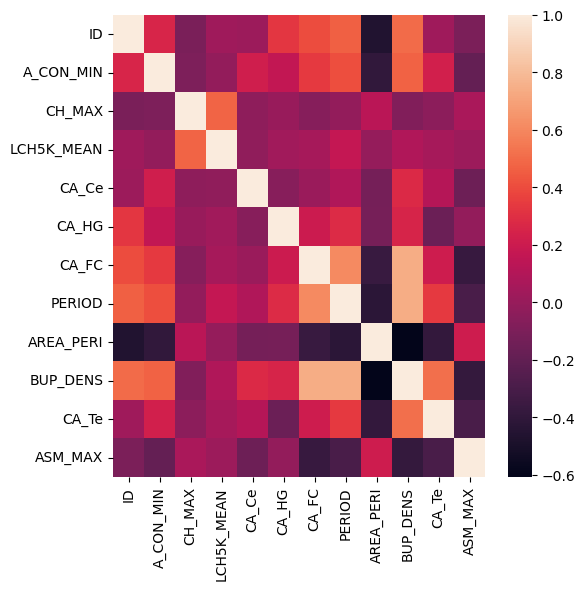

In [21]:
corr_df = var_num[aux].corr(method='pearson')

plt.figure(figsize=(6, 6))
sns.heatmap(corr_df, annot=False)
plt.show()

Transferring the treated variables to the Geom DataFrame:

In [22]:
geom = obj[[indice,'geometry']]
geom = geom.merge(var_num[aux], left_on=indice, right_on=indice)
geom

,ID,geometry,A_CON_MIN,CH_MAX,LCH5K_MEAN,CA_Ce,CA_HG,CA_FC,PERIOD,AREA_PERI,BUP_DENS,CA_Te,ASM_MAX
0,5,"POLYGON ((752688.911 9722816.546, 752689.345 9...",-0.904887,7.657204,-0.565578,-0.182688,0.663551,-0.481669,-0.877458,0.668951,-1.259123,-0.947576,0.258129
1,6,"POLYGON ((752789.095 9722816.113, 752789.529 9...",-0.904887,7.657204,-0.567691,-0.273534,-0.372702,-0.737791,-0.877458,0.694571,-1.259110,-0.947576,-1.118395
2,10,"POLYGON ((753189.831 9722814.381, 753190.263 9...",-0.559015,-0.268752,-0.569704,-0.479358,-0.372702,-0.539551,-0.877458,0.747435,-1.259050,-0.947576,-0.237737
3,11,"POLYGON ((753290.015 9722813.949, 753290.447 9...",-0.559015,-0.269892,-0.569805,-0.479358,-0.372702,-0.760743,-0.877458,0.727739,-1.259021,-0.947576,2.392334
4,12,"POLYGON ((753390.199 9722813.517, 753390.631 9...",-0.586183,-0.270104,-0.569703,-0.479358,-0.372702,-0.356658,-0.877458,0.735039,-1.259008,-0.947576,1.261760
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6296,14338,"POLYGON ((751430.790 9733012.497, 751431.221 9...",1.016402,-0.267912,-0.569805,-0.479358,-0.340505,-0.704990,-1.437618,-1.033767,-1.181086,-0.947576,-0.237737
6297,14339,"POLYGON ((751530.947 9733012.067, 751531.377 9...",1.023387,-0.270266,-0.569805,-0.479358,-0.372702,-0.171943,-1.507638,-1.026069,-0.976498,-0.947576,1.261760
6298,14340,"POLYGON ((751631.104 9733011.636, 751631.534 9...",1.023387,-0.270266,-0.569805,-0.479358,-0.372702,-0.798713,-1.507638,-1.038590,-1.286691,-0.947576,-0.063192
6299,14392,"POLYGON ((751230.907 9733113.276, 751231.338 9...",-0.913516,-0.270334,-0.569805,-0.479358,1.051430,-0.802306,-1.507638,-0.998392,-1.049142,-0.947576,0.400938


### Step 2: Unsupervised classification

Creating a numpy matrix (dados) with the Geom GeoDataFrame to perform the unsupervised classification:

In [23]:
dados = geom.iloc[:,2:].to_numpy()
dados

array([[-0.90488689,  7.65720435, -0.56557768, ..., -1.25912343,
        -0.94757563,  0.25812866],
       [-0.90488689,  7.65720435, -0.56769144, ..., -1.25910968,
        -0.94757563, -1.11839474],
       [-0.55901546, -0.26875231, -0.56970443, ..., -1.25904978,
        -0.94757563, -0.2377372 ],
       ...,
       [ 1.02338739, -0.27026606, -0.56980521, ..., -1.28669098,
        -0.94757563, -0.06319246],
       [-0.91351556, -0.27033386, -0.56980521, ..., -1.04914249,
        -0.94757563,  0.40093798],
       [ 1.01640226, -0.26826658, -0.56980521, ..., -1.03349368,
        -0.94757563,  1.26176042]])

Plotting a dendrogram to identify a good cluster number in the unsupervised classification model:

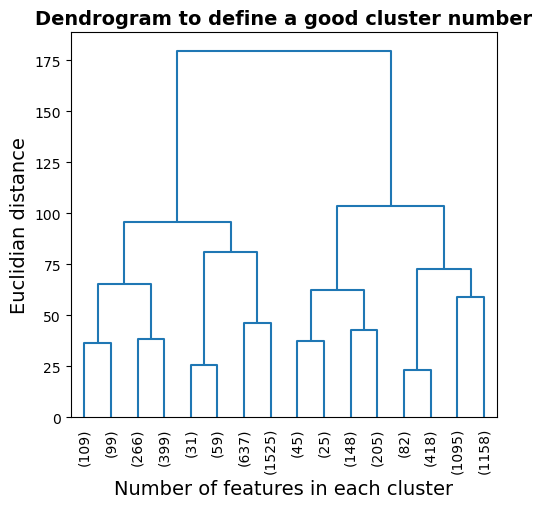

In [24]:
fig, axes = plt.subplots(1, 1, figsize=(5.5,5))

fig.set_facecolor('white')
dendrograma = dendrogram(linkage(dados, method='ward'), ax=axes, p = 3, truncate_mode = 'level', color_threshold = 0.5)
plt.xlabel('Number of features in each cluster', fontsize = 14)
plt.xticks(rotation = 90,  fontsize = 10)
plt.ylabel('Euclidian distance', fontsize = 14);
plt.title('Dendrogram to define a good cluster number', fontsize = 14,weight='bold')
plt.show()

Defining the number of clusters:

In [25]:
numero = 7

Building the unsupervised classification model, using the Hierarchichal Clustering algorithm in an agglomerative way: 

In [26]:
ag_model = AgglomerativeClustering(n_clusters = numero, linkage='ward', affinity='euclidean')
ag_model.fit(dados)

AgglomerativeClustering(n_clusters=7)

Viewing the number of features in each cluster:

In [27]:
unique, counts = np.unique(ag_model.labels_, return_counts=True)

result = np.column_stack((unique, counts)) 
print (result)

[[   0  423]
 [   1 2253]
 [   2  665]
 [   3 2162]
 [   4   90]
 [   5  500]
 [   6  208]]


Including the classification result in the database. For the environmental dimension, adopt as variable name <b>"C_ENV"</b>; for the urban morphological dimension, adopt as variable name <b>"C_URB"</b>:

In [31]:
#var_name = 'C_ENV' # environmental dimension
var_name = 'C_URB' # urban morphological dimension

In [32]:
geom[var_name] = ag_model.labels_

Plotting the cluster map:

<AxesSubplot: >

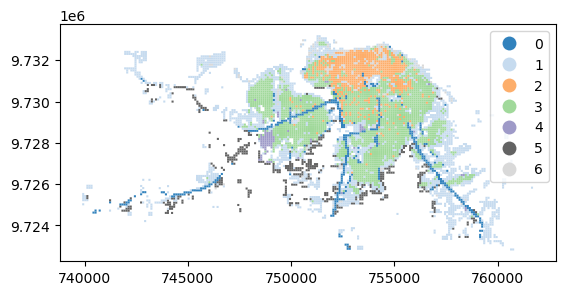

In [33]:
geom.plot(column= geom[var_name], legend=True, categorical=True, cmap = 'tab20c')

In [34]:
geom.explore(column = var_name, tooltip = var_name,tiles="OpenStreetMap",
             categorical = True, cmap='Set2', style_kwds=dict(color="grey", weight=0.01))

Viewing the final database and exporting a shapefile:

In [35]:
geom

,ID,geometry,A_CON_MIN,CH_MAX,LCH5K_MEAN,CA_Ce,CA_HG,CA_FC,PERIOD,AREA_PERI,BUP_DENS,CA_Te,ASM_MAX,C_URB
0,5,"POLYGON ((752688.911 9722816.546, 752689.345 9...",-0.904887,7.657204,-0.565578,-0.182688,0.663551,-0.481669,-0.877458,0.668951,-1.259123,-0.947576,0.258129,0
1,6,"POLYGON ((752789.095 9722816.113, 752789.529 9...",-0.904887,7.657204,-0.567691,-0.273534,-0.372702,-0.737791,-0.877458,0.694571,-1.259110,-0.947576,-1.118395,0
2,10,"POLYGON ((753189.831 9722814.381, 753190.263 9...",-0.559015,-0.268752,-0.569704,-0.479358,-0.372702,-0.539551,-0.877458,0.747435,-1.259050,-0.947576,-0.237737,1
3,11,"POLYGON ((753290.015 9722813.949, 753290.447 9...",-0.559015,-0.269892,-0.569805,-0.479358,-0.372702,-0.760743,-0.877458,0.727739,-1.259021,-0.947576,2.392334,1
4,12,"POLYGON ((753390.199 9722813.517, 753390.631 9...",-0.586183,-0.270104,-0.569703,-0.479358,-0.372702,-0.356658,-0.877458,0.735039,-1.259008,-0.947576,1.261760,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6296,14338,"POLYGON ((751430.790 9733012.497, 751431.221 9...",1.016402,-0.267912,-0.569805,-0.479358,-0.340505,-0.704990,-1.437618,-1.033767,-1.181086,-0.947576,-0.237737,1
6297,14339,"POLYGON ((751530.947 9733012.067, 751531.377 9...",1.023387,-0.270266,-0.569805,-0.479358,-0.372702,-0.171943,-1.507638,-1.026069,-0.976498,-0.947576,1.261760,1
6298,14340,"POLYGON ((751631.104 9733011.636, 751631.534 9...",1.023387,-0.270266,-0.569805,-0.479358,-0.372702,-0.798713,-1.507638,-1.038590,-1.286691,-0.947576,-0.063192,1
6299,14392,"POLYGON ((751230.907 9733113.276, 751231.338 9...",-0.913516,-0.270334,-0.569805,-0.479358,1.051430,-0.802306,-1.507638,-0.998392,-1.049142,-0.947576,0.400938,1


In [ ]:
geom.to_file("urban_morphological_dimension/clusters_urb_santarem.shp")